Notebook jest częścią artykułu "Wykryj je wszystkie! Nowoczesne podejścia do Detekcji i Rozpoznawania Tekstu w Naturalnej Scenerii", autorzy Michał Mazuryk i Piotr Matys.

**ZADANIE** : Rozpoznaj markę butelki na obrazie - w naszym przykładzie posłużymy się puszką Redbulla, możesz wgrać swój własny przykład:)

## Object Detection

Detekcja tekstu jest wartościowa jeżeli wiemy z jakiego miejsca pochodzi - dlatego najpierw postaramy się wykryć butelkę na obrazie, aby nie odczytywać tekstu z otoczenia, który nie ma dla nas wartości.

### Importy

W naszym przykładzie posłużymy się popularnym modelem YOLOv8 z biblioteki ultralytics. Pamiętajcie, że model jest na licencji AGPL-3.0 License, co jest ważne dla biznesowego użycia. Więcej informacji na stronie: https://docs.ultralytics.com/#yolo-a-brief-history

In [ ]:
!pip install ultralytics torch

In [ ]:
from PIL import Image
import os
import numpy as np
import cv2
from ultralytics import YOLO
import requests
import torch
from io import BytesIO
from google.colab.patches import cv2_imshow

In [ ]:
# Wczytujemy model
model = YOLO("yolov8n.pt")

In [ ]:
# Ścieżka do naszego pełnego zdjęcia
IMG_PATH = 'full.jpg'

In [ ]:
img = Image.open(IMG_PATH)
img_array = np.array(img)

### Funkcje do wyświetlenia rezultatów z modelu YOLO

Funkcje pochodzą z artykułu: https://inside-machinelearning.com/en/yolov8-how-to-use/

In [ ]:
labels = {0: u'__background__', 1: u'person', 2: u'bicycle',3: u'car', 4: u'motorcycle', 5: u'airplane', 6: u'bus', 7: u'train', 8: u'truck', 9: u'boat', 10: u'traffic light', 11: u'fire hydrant', 12: u'stop sign', 13: u'parking meter', 14: u'bench', 15: u'bird', 16: u'cat', 17: u'dog', 18: u'horse', 19: u'sheep', 20: u'cow', 21: u'elephant', 22: u'bear', 23: u'zebra', 24: u'giraffe', 25: u'backpack', 26: u'umbrella', 27: u'handbag', 28: u'tie', 29: u'suitcase', 30: u'frisbee', 31: u'skis', 32: u'snowboard', 33: u'sports ball', 34: u'kite', 35: u'baseball bat', 36: u'baseball glove', 37: u'skateboard', 38: u'surfboard', 39: u'tennis racket', 40: u'bottle', 41: u'wine glass', 42: u'cup', 43: u'fork', 44: u'knife', 45: u'spoon', 46: u'bowl', 47: u'banana', 48: u'apple', 49: u'sandwich', 50: u'orange', 51: u'broccoli', 52: u'carrot', 53: u'hot dog', 54: u'pizza', 55: u'donut', 56: u'cake', 57: u'chair', 58: u'couch', 59: u'potted plant', 60: u'bed', 61: u'dining table', 62: u'toilet', 63: u'tv', 64: u'laptop', 65: u'mouse', 66: u'remote', 67: u'keyboard', 68: u'cell phone', 69: u'microwave', 70: u'oven', 71: u'toaster', 72: u'sink', 73: u'refrigerator', 74: u'book', 75: u'clock', 76: u'vase', 77: u'scissors', 78: u'teddy bear', 79: u'hair drier', 80: u'toothbrush'}

def box_label(image, box, label='', color=(128, 128, 128), txt_color=(255, 255, 255)):
  lw = max(round(sum(image.shape) / 2 * 0.003), 2)
  p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
  cv2.rectangle(image, p1, p2, color, thickness=lw, lineType=cv2.LINE_AA)
  if label:
    tf = max(lw - 1, 1)  # font thickness
    w, h = cv2.getTextSize(label, 0, fontScale=lw / 3, thickness=tf)[0]  # text width, height
    outside = p1[1] - h >= 3
    p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
    print(f'label: {label},p1: {p1},p2: {p2}')
    cv2.rectangle(image, p1, p2, color, -1, cv2.LINE_AA)  # filled
    cv2.putText(image,
                label, (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),
                0,
                lw / 3,
                txt_color,
                thickness=tf,
                lineType=cv2.LINE_AA)

def plot_bboxes(image, boxes, labels=[], colors=[], score=True, conf=None):
  #Define COCO Labels
  if labels == []:
    labels = {0: u'__background__', 1: u'person', 2: u'bicycle',3: u'car', 4: u'motorcycle', 5: u'airplane', 6: u'bus', 7: u'train', 8: u'truck', 9: u'boat', 10: u'traffic light', 11: u'fire hydrant', 12: u'stop sign', 13: u'parking meter', 14: u'bench', 15: u'bird', 16: u'cat', 17: u'dog', 18: u'horse', 19: u'sheep', 20: u'cow', 21: u'elephant', 22: u'bear', 23: u'zebra', 24: u'giraffe', 25: u'backpack', 26: u'umbrella', 27: u'handbag', 28: u'tie', 29: u'suitcase', 30: u'frisbee', 31: u'skis', 32: u'snowboard', 33: u'sports ball', 34: u'kite', 35: u'baseball bat', 36: u'baseball glove', 37: u'skateboard', 38: u'surfboard', 39: u'tennis racket', 40: u'bottle', 41: u'wine glass', 42: u'cup', 43: u'fork', 44: u'knife', 45: u'spoon', 46: u'bowl', 47: u'banana', 48: u'apple', 49: u'sandwich', 50: u'orange', 51: u'broccoli', 52: u'carrot', 53: u'hot dog', 54: u'pizza', 55: u'donut', 56: u'cake', 57: u'chair', 58: u'couch', 59: u'potted plant', 60: u'bed', 61: u'dining table', 62: u'toilet', 63: u'tv', 64: u'laptop', 65: u'mouse', 66: u'remote', 67: u'keyboard', 68: u'cell phone', 69: u'microwave', 70: u'oven', 71: u'toaster', 72: u'sink', 73: u'refrigerator', 74: u'book', 75: u'clock', 76: u'vase', 77: u'scissors', 78: u'teddy bear', 79: u'hair drier', 80: u'toothbrush'}
  #Define colors
  if colors == []:
    #colors = [(6, 112, 83), (253, 246, 160), (40, 132, 70), (205, 97, 162), (149, 196, 30), (106, 19, 161), (127, 175, 225), (115, 133, 176), (83, 156, 8), (182, 29, 77), (180, 11, 251), (31, 12, 123), (23, 6, 115), (167, 34, 31), (176, 216, 69), (110, 229, 222), (72, 183, 159), (90, 168, 209), (195, 4, 209), (135, 236, 21), (62, 209, 199), (87, 1, 70), (75, 40, 168), (121, 90, 126), (11, 86, 86), (40, 218, 53), (234, 76, 20), (129, 174, 192), (13, 18, 254), (45, 183, 149), (77, 234, 120), (182, 83, 207), (172, 138, 252), (201, 7, 159), (147, 240, 17), (134, 19, 233), (202, 61, 206), (177, 253, 26), (10, 139, 17), (130, 148, 106), (174, 197, 128), (106, 59, 168), (124, 180, 83), (78, 169, 4), (26, 79, 176), (185, 149, 150), (165, 253, 206), (220, 87, 0), (72, 22, 226), (64, 174, 4), (245, 131, 96), (35, 217, 142), (89, 86, 32), (80, 56, 196), (222, 136, 159), (145, 6, 219), (143, 132, 162), (175, 97, 221), (72, 3, 79), (196, 184, 237), (18, 210, 116), (8, 185, 81), (99, 181, 254), (9, 127, 123), (140, 94, 215), (39, 229, 121), (230, 51, 96), (84, 225, 33), (218, 202, 139), (129, 223, 182), (167, 46, 157), (15, 252, 5), (128, 103, 203), (197, 223, 199), (19, 238, 181), (64, 142, 167), (12, 203, 242), (69, 21, 41), (177, 184, 2), (35, 97, 56), (241, 22, 161)]
    colors = [(89, 161, 197),(67, 161, 255),(19, 222, 24),(186, 55, 2),(167, 146, 11),(190, 76, 98),(130, 172, 179),(115, 209, 128),(204, 79, 135),(136, 126, 185),(209, 213, 45),(44, 52, 10),(101, 158, 121),(179, 124, 12),(25, 33, 189),(45, 115, 11),(73, 197, 184),(62, 225, 221),(32, 46, 52),(20, 165, 16),(54, 15, 57),(12, 150, 9),(10, 46, 99),(94, 89, 46),(48, 37, 106),(42, 10, 96),(7, 164, 128),(98, 213, 120),(40, 5, 219),(54, 25, 150),(251, 74, 172),(0, 236, 196),(21, 104, 190),(226, 74, 232),(120, 67, 25),(191, 106, 197),(8, 15, 134),(21, 2, 1),(142, 63, 109),(133, 148, 146),(187, 77, 253),(155, 22, 122),(218, 130, 77),(164, 102, 79),(43, 152, 125),(185, 124, 151),(95, 159, 238),(128, 89, 85),(228, 6, 60),(6, 41, 210),(11, 1, 133),(30, 96, 58),(230, 136, 109),(126, 45, 174),(164, 63, 165),(32, 111, 29),(232, 40, 70),(55, 31, 198),(148, 211, 129),(10, 186, 211),(181, 201, 94),(55, 35, 92),(129, 140, 233),(70, 250, 116),(61, 209, 152),(216, 21, 138),(100, 0, 176),(3, 42, 70),(151, 13, 44),(216, 102, 88),(125, 216, 93),(171, 236, 47),(253, 127, 103),(205, 137, 244),(193, 137, 224),(36, 152, 214),(17, 50, 238),(154, 165, 67),(114, 129, 60),(119, 24, 48),(73, 8, 110)]

  #plot each boxes
  for box in boxes:
    #add score in label if score=True
    if score :
      label = labels[int(box[-1])+1] + " " + str(round(100 * float(box[-2]),1)) + "%"
    else :
      label = labels[int(box[-1])+1]
    #filter every box under conf threshold if conf threshold setted
    if conf :
      if box[-2] > conf:
        color = colors[int(box[-1])]
        box_label(image, box, label, color)
    else:
      color = colors[int(box[-1])]
      box_label(image, box, label, color)

  #show image
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  try:
    import google.colab
    IN_COLAB = True
  except:
    IN_COLAB = False

  if IN_COLAB:
    cv2_imshow(image) #if used in Colab
  else :
    cv2.imshow(image) #if used in Python

### Użycie modelu

In [ ]:
# Predykujemy zdjęcie za pomocą modelu
results = model.predict(img_array, save_crop=False, conf = 0.5)


0: 640x480 1 bottle, 194.1ms
Speed: 6.2ms preprocess, 194.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


label: bottle 57.5%,p1: (460, 2751),p2: (1129, 2673)


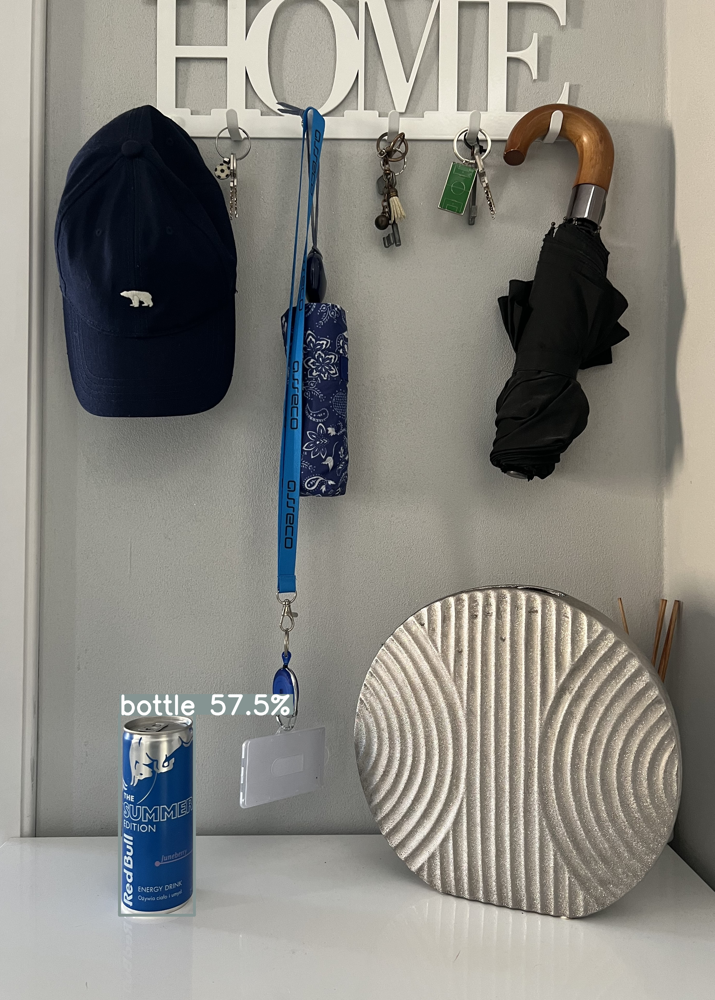

In [ ]:
plot_bboxes(img_array, results[0].boxes.data, score=True)

In [ ]:
# Przechodzimy przez predykcje modelu, jeżeli znaleźliśmy klasę - butelka, zapisujemy jej ucięty obszar jako cropped_bottle.jpg
img = Image.open(IMG_PATH)
img_array = np.array(img)

for box in results[0].boxes.data:

    label = labels[int(box[-1])+1]
    x1, y1, x2, y2 = int(box[0]), int(box[1]), int(box[2]), int(box[3])

    print("Class:", label)
    print("Bounding box coordinates:", x1, y1, x2, y2)

    if (label == 'bottle'):
      img_bottle = Image.fromarray(img_array[y1:y2, x1:x2])
      img_bottle.save('cropped_bottle.jpg')

Class: bottle
Bounding box coordinates: 460 2751 749 3524


Końcowo otrzymaliśmy zdjęcie, na którym mamy tylko naszą butelkę - możemy przejść do kolejnego kroku!

## Scene Text Detection (Detekcja Tekstu)


Do detekcji tekstu posłużymy się modelem CRAFT, zajmuje on 17. miejsce na benchmarku Total-Text i dzięki swojej architekturze bazującej na tworzeniu heatmapy per litera oraz zwracania drugiej warstwy wyniku jako wykrywanie przestrzeni między literami, idealnie pasował do naszego problemu (więcej informacji: https://paperswithcode.com/paper/character-region-awareness-for-text-detection). Jego implementacja została dodana do biblioteki easyocr.

### Importy

In [ ]:
# Biblioteki paddleocr posłużymy się tylko do tworzenia wizualizacji rezultatu - będzie podana alternatywna opcja
!pip install paddlepaddle paddleocr

In [ ]:
!pip install easyocr

In [ ]:
import easyocr
from IPython.display import display, Markdown
# Tylko do wizualizacji
from paddleocr import draw_ocr

In [ ]:
image = Image.open("cropped_bottle.jpg")
img_array = np.array(image)

### Użycie modelu

In [ ]:
# Wgranie modelu
reader = easyocr.Reader(['en'])

In [ ]:
# Predykujemy zdjęcie
easyocr_result = reader.readtext(image)

# Wyświetlamy wyniki
display(Markdown('##EasyOCR Result:'))
for detection in easyocr_result:
    bbox, text, confidence = detection
    display(Markdown(f"**Text:** {text}, **Confidence:** {round(confidence,3)}"))

##EasyOCR Result:

**Text:** JUMIMD, **Confidence:** 0.058

**Text:** 1, **Confidence:** 0.424

**Text:** ONERGII, **Confidence:** 0.225

**Text:** the, **Confidence:** 0.39

**Text:** EDITION, **Confidence:** 0.457

**Text:** luneberty, **Confidence:** 0.606

**Text:** DRINK, **Confidence:** 0.999

**Text:** 'Umyst, **Confidence:** 0.272

**Text:** cialo, **Confidence:** 0.754

**Easyocr** łączy ze sobą wykrywanie i odczyt tekstu, chcielibyśmy skorzystać jedynie z jego wykrycia za pomocą modelu CRAFT.

In [ ]:
# Zapisanie współrzędnych wykrycia
coords = [coord for (coord, text, prob) in easyocr_result]

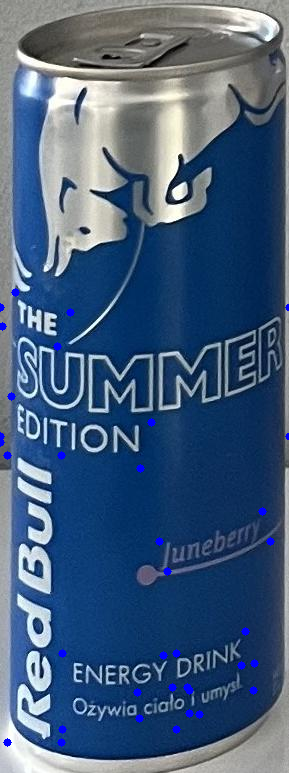

In [ ]:
# Wyświetlenie bounding-boxa prostszą metodą - bez użycia paddleocr
for (coord, text, prob) in easyocr_result:

  (topleft, topright, bottomright, bottomleft) = coord
  tx,ty = (int(topleft[0]), int(topleft[1]))
  bx,by = (int(bottomright[0]), int(bottomright[1]))
  cv2.circle(img_array, (int(topleft[0]), int(topleft[1])), 4, (0, 0, 255), -1)
  cv2.circle(img_array, (int(topright[0]), int(topright[1])),4, (0, 0, 255), -1)
  cv2.circle(img_array, (int(bottomright[0]), int(bottomright[1])), 4, (0, 0, 255), -1)
  cv2.circle(img_array, (int(bottomleft[0]), int(bottomleft[1])), 4, (0, 0, 255), -1)

img_array_rgb = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)
cv2_imshow(img_array_rgb)

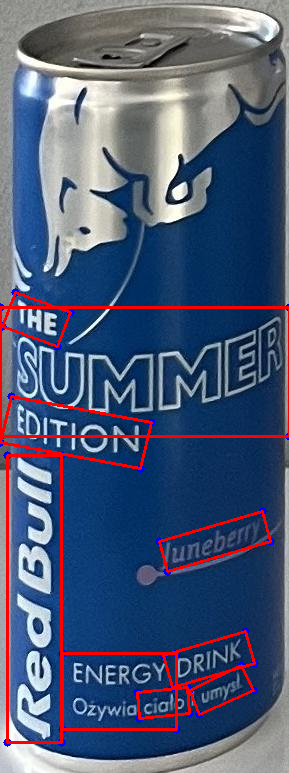

In [ ]:
# Wizualizacja z użyciem biblioteki paddleocr
im_show = draw_ocr(
    img_array,
    coords,
    txts=None,
    scores=None,
    font_path=os.path.join("PaddleOCR", "doc", "fonts", "simfang.ttf")
)
Image.fromarray(im_show)

Mamy już potencjalne obszary z tekstem, pozostaje użyć modelu do rozpoznania tekstu!

## Scene Text Recognition (Rozpoznanie Tekstu)

Do rozpoznania tekstu posłużymy się modelem PARSEQ szerzej opisanym w naszym artykule oraz u autorów: 2207.06966.pdf (arxiv.org)

### Importy

In [ ]:
!pip install pip-tools

In [ ]:
# Klonujemy repozytorium z parseq
!git clone https://github.com/baudm/parseq

In [ ]:
%cd parseq/
# Model możemy uruchomić w trybie tylko cpu
platform='cpu'

!make torch-cpu

!pip install -r requirements/core.cpu.txt -e .[train,test]

In [ ]:
from strhub.data.module import SceneTextDataModule
import torch

In [ ]:
IMG_PATH = "cropped_bottle.jpg"

img = Image.open(IMG_PATH)
img_array = np.array(img)

### Użycie modelu

In [ ]:
# Wgranie modelu i obiektu do transformacji zdjęcia do formatu wejścia modelu
parseq = torch.hub.load('baudm/parseq', 'parseq', pretrained=True).eval()
img_transform = SceneTextDataModule.get_transform(parseq.hparams.img_size)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/baudm/parseq/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://github.com/baudm/parseq/releases/download/v1.0.0/parseq-bb5792a6.pt" to /root/.cache/torch/hub/checkpoints/parseq-bb5792a6.pt
100%|██████████| 91.0M/91.0M [00:00<00:00, 133MB/s]


##Parseq Result:

**Cropped image:**

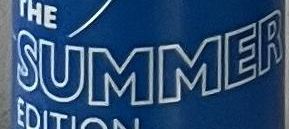

**Label:** ['SUMMER'], **Confidance:** [          1           1           1           1           1       0.996       0.939]

**Cropped image:**

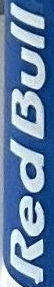

**Label:** ['RedBull'], **Confidance:** [          1       0.999           1       0.996       0.998           1           1       0.999]

**Cropped image:**

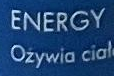

**Label:** ['Ozywiacial'], **Confidance:** [      0.989       0.999           1       0.998       0.968       0.994       0.996       0.999       0.998       0.997       0.991]

**Cropped image:**

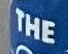

**Label:** ['THE'], **Confidance:** [          1           1           1           1]

**Cropped image:**

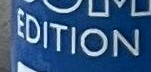

**Label:** ['EDITION'], **Confidance:** [          1           1           1           1           1           1           1       0.998]

**Cropped image:**

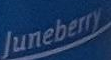

**Label:** ['Juneberry'], **Confidance:** [      0.935       0.999           1           1       0.999           1           1           1           1       0.993]

**Cropped image:**

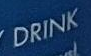

**Label:** ['DRINK'], **Confidance:** [          1           1           1           1           1       0.999]

**Cropped image:**

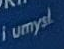

**Label:** ['umyst'], **Confidance:** [      0.968       0.992       0.992       0.998        0.48       0.504]

**Cropped image:**

**Label:** ['cialo'], **Confidance:** [      0.997       0.998       0.997       0.921       0.996       0.999]

In [ ]:
display(Markdown('##Parseq Result:'))
# Idziemy po współrzędnych uzyskanych w kroku Scene Object Detection
for coord in coords:
  only_pred = np.array(coord).astype(int)
  x_min, y_min = np.min(only_pred, axis=0)
  x_max, y_max = np.max(only_pred, axis=0)
  # Ucinamy zdjęcie do danych współrzędnych potencjalnego tekstu
  cropped_img = Image.fromarray(img_array[y_min : y_max, x_min : x_max])
  display(Markdown(f'**Cropped image:**'))
  display(cropped_img)
  # Używamy obiektu do transformacji zdjęcia do modelu
  transformed_img = img_transform(cropped_img).unsqueeze(0)
  # Otrzymujemy predykcję i zamieniamy logitsy na pstwo
  logits = parseq(transformed_img)
  pred = logits.softmax(-1)
  # Odczytujemy wynik i pstwo per znak (otrzymujemy również pstwo znaku końca linii)
  label, confidence = parseq.tokenizer.decode(pred)

  display(Markdown(f'**Label:** {label}, **Confidance:** {np.round(confidence[0].detach().numpy(),3)}'))

Otrzymaliśmy naszą predykcję i prawidłowo odczytaliśmy naszą markę Redbull i dodatkowe informacje o smaku i edycji! Niektóre wyniki jak 'umysł' i 'ciało' nie zostały dobrze odczytane, ponieważ model PARSEQ działa dla języka angielskiego, ale jest możliwość fine-tunowania go do języka polskiego.

Dziękujemy za Twoją uwagę i zainteresowanie naszym artykułem, możesz śmiało modyfikować ten notebook i wykorzystać go do swoich testów. Może uda ci się osiągnąć jeszcze lepsze wyniki niż zaprezentowaliśmy:)